# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

# from plotly import plotly
# import plotly.offline as offline
# import plotly.graph_objs as go
# offline.init_notebook_mode()
from collections import Counter
from sklearn.model_selection import train_test_split
import sklearn.model_selection as model_selection

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [5]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [6]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [7]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [8]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [9]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

The mediocre teacher tells. The good teacher explains. The superior teacher demonstrates. The great teacher inspires. -William A. Ward\r\n\r\nMy school has 803 students which is makeup is 97.6% African-American, making up the largest segment of the student body. A typical school in Dallas is made up of 23.2% African-American students. Most of the students are on free or reduced lunch. We aren't receiving doctors, lawyers, or engineers children from rich backgrounds or neighborhoods. As an educator I am inspiring minds of young children and we focus not only on academics but one smart, effective, efficient, and disciplined students with good character.In our classroom we can utilize the Bluetooth for swift transitions during class. I use a speaker which doesn't amplify the sound enough to receive the message. Due to the volume of my speaker my students can't hear videos or books clearly and it isn't making the lessons as meaningful. But with the bluetooth speaker my students will be abl

In [10]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [11]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [12]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [13]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [14]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [15]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 109248/109248 [01:03<00:00, 1716.16it/s]


In [16]:
# after preprocesing
project_data['processed_essay'] = preprocessed_essays;
project_data.drop(['essay'], axis=1, inplace=True)
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [17]:
processed_titles = [];
for title in tqdm(project_data['project_title'].values):
    sent = decontracted(title)
    sent = re.sub('\S*\d\S*', '', sent);
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    processed_titles.append(sent.strip())


100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 109248/109248 [00:02<00:00, 53167.56it/s]


In [18]:
project_data.drop(['project_title'], axis=1, inplace=True)
project_data['processed_titles'] = processed_titles

#testing after preprocessing project_title column
print(processed_titles[3])

print(processed_titles[40]);

print(processed_titles[500]);

print(processed_titles[4000]);

project_data.columns

Techie Kindergarteners
Leveling Books in a Multi Age Class
Classroom Chromebooks for College Bound Seniors
Inspire Summer Reading


Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'processed_essay',
       'processed_titles'],
      dtype='object')

## Preprocessing of project_grade_category

In [19]:
print(project_data['project_grade_category'][1])
print(project_data['project_grade_category'][223])
print(project_data['project_grade_category'][134])

Grades 6-8
Grades PreK-2
Grades PreK-2


In [20]:
processed_grades = [];
for grades in project_data['project_grade_category']:
    grades = grades.replace('-', '');
    processed_grades.append(grades)

In [21]:
print(processed_grades[1])
print(processed_grades[223])
print(processed_grades[134])

project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data['processed_grades'] = processed_grades

Grades 68
Grades PreK2
Grades PreK2


## Preprocessing of teacher_prefix

In [22]:
print(project_data['teacher_prefix'][2]);
print(project_data['teacher_prefix'][234]);
print(project_data['teacher_prefix'][425]);


Ms.
Ms.
Ms.


In [23]:
preprocessed_teacher_prefix = [];
for prefix in project_data['teacher_prefix']:
    prefix = str(prefix).replace('.', '');
    preprocessed_teacher_prefix.append(prefix);


In [24]:
project_data.drop(['teacher_prefix'], axis=1, inplace=True)
project_data['processed_teacher_prefix'] = preprocessed_teacher_prefix

print(preprocessed_teacher_prefix[321])
print(preprocessed_teacher_prefix[310])

Mrs
Ms


## 1.5 Preparing data for models

In [25]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'school_state',
       'project_submitted_datetime', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'processed_essay',
       'processed_titles', 'processed_grades', 'processed_teacher_prefix'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

## Merging Price from resource_Data

In [26]:
price = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index();
project_data = pd.merge(project_data, price, on='id', how='left');
project_data.columns


Index(['Unnamed: 0', 'id', 'teacher_id', 'school_state',
       'project_submitted_datetime', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'processed_essay',
       'processed_titles', 'processed_grades', 'processed_teacher_prefix',
       'price', 'quantity'],
      dtype='object')

## Importing Glove, pretrained model, which we use for word2vec

In [27]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakage, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [28]:
#splitting project_data into x and y, y=project_is_approved.

#fetching all the columns except project_is_approved.
cols_to_select = [col for col in project_data.columns if col != 'project_is_approved'];
X = project_data[cols_to_select]
print(X.columns)
y = project_data['project_is_approved'];
print(y.shape)

Index(['Unnamed: 0', 'id', 'teacher_id', 'school_state',
       'project_submitted_datetime', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'clean_categories',
       'clean_subcategories', 'processed_essay', 'processed_titles',
       'processed_grades', 'processed_teacher_prefix', 'price', 'quantity'],
      dtype='object')
(109248,)


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

## Vectorizing Categorical features

In [29]:
#vectorizing school_state
from sklearn.feature_extraction.text import CountVectorizer


#creating dictionary for school_state as state as keys along with no. of projects from that state as values.
school_state_dict = dict(X['school_state'].value_counts());

#configuring CountVectorizer for school state, in which vocabulary will be name of states.
vectorizer = CountVectorizer(vocabulary=list(school_state_dict.keys()), lowercase=False, binary=True);

#applying vectorizer on school_state column to obtain numerical value for each state.
vectorizer.fit(X['school_state'].values);

school_state_vector = vectorizer.transform(X['school_state'].values);

print('shape of matrix after one hot encoding of school_state for train data ', school_state_vector.shape);

features_name_list = vectorizer.get_feature_names();

shape of matrix after one hot encoding of school_state for train data  (109248, 51)


In [30]:
#vectorizing categories

vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True);

vectorizer.fit(X['clean_categories'].values);

categories_vector = vectorizer.transform(X['clean_categories'].values);

print('shape of matrix after one hot encoding of clean_categories for train data', categories_vector.shape)

features_name_list.extend( vectorizer.get_feature_names());

shape of matrix after one hot encoding of clean_categories for train data (109248, 9)


In [31]:
#vectorizing subcategories

vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True);

vectorizer.fit(X['clean_subcategories'].values);

subcategories_vector = vectorizer.transform(X['clean_subcategories'].values);

print('shape of matrix after one hot encoding of clean_subcategories for train data', subcategories_vector.shape)

features_name_list.extend( vectorizer.get_feature_names());

shape of matrix after one hot encoding of clean_subcategories for train data (109248, 30)


In [32]:
#vectorizing project_grade_category

grade_dict = dict(X['processed_grades'].value_counts());

vectorizer = CountVectorizer(vocabulary=list(grade_dict.keys()), lowercase=False, binary=True);

vectorizer.fit(X['processed_grades'].values);

grade_vector = vectorizer.transform(X['processed_grades'].values);

print('shape of matrix after one hot encoding of grade_category for train data', grade_vector.shape)

features_name_list.extend( vectorizer.get_feature_names());

shape of matrix after one hot encoding of grade_category for train data (109248, 4)


In [33]:
#vectorizing teacher_prefix

teacher_prefix_dict = dict(X['processed_teacher_prefix'].value_counts());

vectorizer = CountVectorizer(vocabulary=list(teacher_prefix_dict.keys()), lowercase=False, binary=True);

vectorizer.fit(X['processed_teacher_prefix'].values.astype('U'));

teacher_prefix_vector = vectorizer.transform(X['processed_teacher_prefix'].values.astype('U'));

print('shape of matrix after one hot encoding of teacher_prefix for train data', teacher_prefix_vector.shape)

features_name_list.extend( vectorizer.get_feature_names());

shape of matrix after one hot encoding of teacher_prefix for train data (109248, 6)


## Encoding Numerical data

In [34]:
#vectorizing price

from sklearn.preprocessing import Normalizer
price_normalizer = Normalizer()
#configuring StandarScaler to obtain the mean and variance.
price_normalizer.fit(X['price'].values.reshape(-1, 1));

# Now standardize the data with maen and variance obtained above.
price_standardized = price_normalizer.transform(X['price'].values.reshape(-1, 1))

features_name_list.append('price');

In [35]:
#vectorizing teacher_number_of_previously_posted_projects

teacher_normalizer = Normalizer();

teacher_normalizer.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1));

teacher_number_standardized = teacher_normalizer.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1));

features_name_list.append('teacher number of previously posted projects');

In [36]:
#vectorizing quantity:

quantity_normalizer = Normalizer();

quantity_normalizer.fit(X['quantity'].values.reshape(-1, 1));

quantity_standardized = quantity_normalizer.transform(X['quantity'].values.reshape(-1, 1))

features_name_list.append('quantity');

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

## Vectorizing using tf-idf

In [37]:
#vectorizing essay

#importing TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

#configuring TfidfVectorizer with a word to occur atleast in 10 documnets.
vectorizer = TfidfVectorizer(min_df=10, ngram_range=(1,2), max_features=5000)

vectorizer.fit(X['processed_essay']);

#vectorizing essay using tfidf
essay_tfidf = vectorizer.transform(X['processed_essay']);

print("Shape of matrix after one hot encoding for train data: ",essay_tfidf.shape)

Shape of matrix after one hot encoding for train data:  (109248, 5000)


In [38]:
tfidf_features_name = vectorizer.get_feature_names()
len(tfidf_features_name)

5000

In [39]:
#vectorizing project_title

vectorizer = TfidfVectorizer(min_df=10, ngram_range=(1,2), max_features=5000);

vectorizer.fit(X['processed_titles']);

title_tfidf = vectorizer.transform(X['processed_titles']);

print('Shape of title_tfidf after one hot encoding for train data ', title_tfidf.shape)

Shape of title_tfidf after one hot encoding for train data  (109248, 5000)


In [40]:
tfidf_features_name.extend(vectorizer.get_feature_names())
print(len(tfidf_features_name))

10000


In [41]:
final_features_name = [];
final_features_name.extend(features_name_list);
final_features_name.extend(tfidf_features_name);
print(len(final_features_name))

10103


## Vectorizing using avg w2v for DBSCAN

In [42]:
import spacy
nlp = spacy.load('en_core_web_lg')

#vectorizing essay
essay_w2v = []

for essay in X['processed_essay']:
    doc = nlp(essay)
    essay_w2v.append(doc.vector)
    
#vectorizing project_title
title_w2v = []
for title in X['processed_titles']:
    doc = nlp(title)
    title_w2v.append(doc.vector)

### 1.5.4 Merging all the above features

In [43]:
from scipy.sparse import hstack

#concatinating train data 

#with tfidf
train_set = hstack((school_state_vector, categories_vector, subcategories_vector, grade_vector, teacher_prefix_vector, price_standardized, teacher_number_standardized, quantity_standardized, essay_tfidf, title_tfidf)).tocsr()
                     

#with w2v
train_set_w2v = hstack((school_state_vector, categories_vector, subcategories_vector, grade_vector, teacher_prefix_vector, price_standardized, teacher_number_standardized, quantity_standardized, essay_w2v, title_w2v)).tocsr()
  


<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [44]:
#selecting best 2000 features from set2 containing tidf
from sklearn.feature_selection import SelectKBest, chi2

selector = SelectKBest(chi2, k=5000)

selector.fit(train_set, y)

new_train_set = selector.transform(train_set)
print('Train data: Shape of older data: {}, shape of new data: {}'.format(train_set.shape, new_train_set.shape))

Train data: Shape of older data: (109248, 10103), shape of new data: (109248, 5000)


In [45]:
from wordcloud import WordCloud

def plot_wordCloud(clusters_essay_dictionary):
    for pair in clusters_essay_dictionary.items():
        cluster_no = pair[0];
        essay_list = pair[1];

        essay_str = "";
        for essay in essay_list:
            essay_str = essay_str + essay + ' ';

        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(essay_str)

        plt.figure(figsize = (8, 8), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title('Word cloud for essay of cluster ' + str(cluster_no) );
        plt.show() 
    

<h2>2.5 Apply Kmeans</h2>

In [46]:
from sklearn.cluster import KMeans

clusters_count = [1, 5, 10, 15, 20 ];
inertia = [];

for cluster in clusters_count:
    kmeans = KMeans(n_clusters=cluster, random_state=0, n_jobs=-1);
    kmeans.fit(new_train_set);
    inertia.append(kmeans.inertia_);



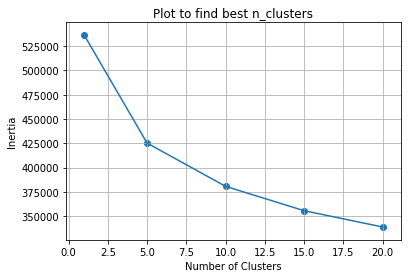

In [47]:
plt.plot( clusters_count, inertia);
plt.scatter(clusters_count, inertia);
plt.xlabel('Number of Clusters');
plt.ylabel('Inertia');
plt.title('Plot to find best n_clusters');
plt.grid();
plt.show();

In [48]:
kmeans_optimal_n_clusters = 10;

kmeans = KMeans(n_clusters=kmeans_optimal_n_clusters, random_state=0, n_jobs=-1);
kmeans.fit(new_train_set);


In [49]:
kmeans.labels_

array([0, 2, 2, ..., 7, 9, 6])

In [50]:
clusters_essay_dictionary = {i: X.loc[kmeans.labels_ == i, 'processed_essay'] for i in range(kmeans_optimal_n_clusters)}

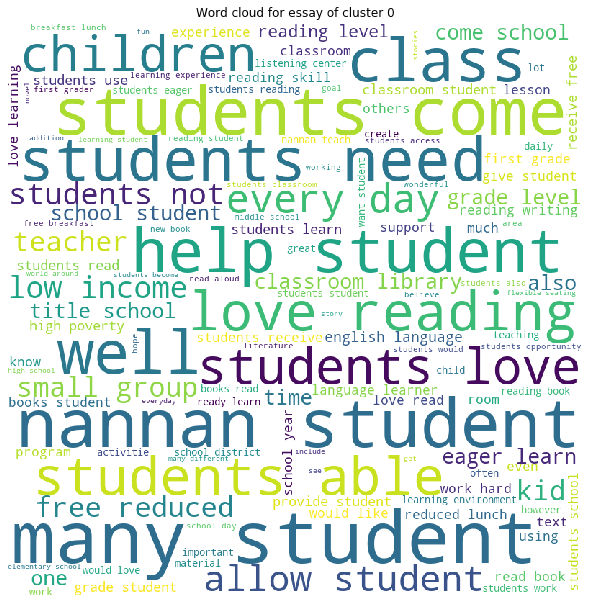

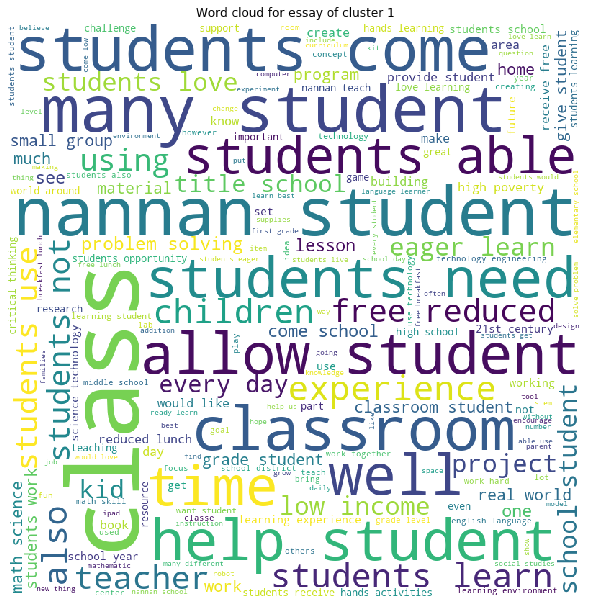

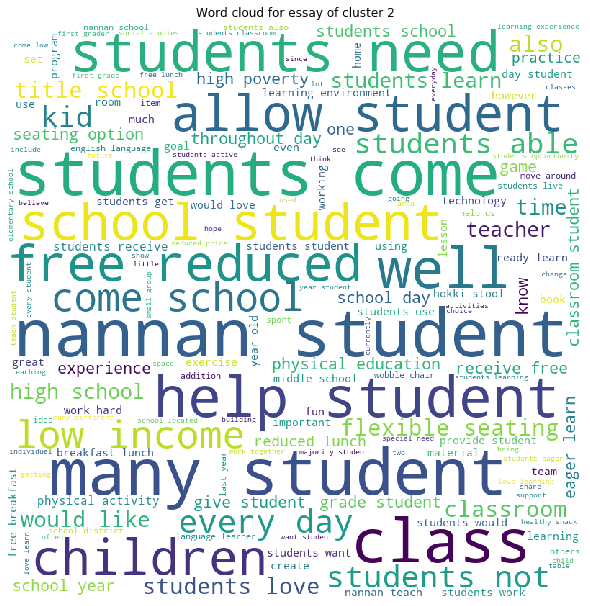

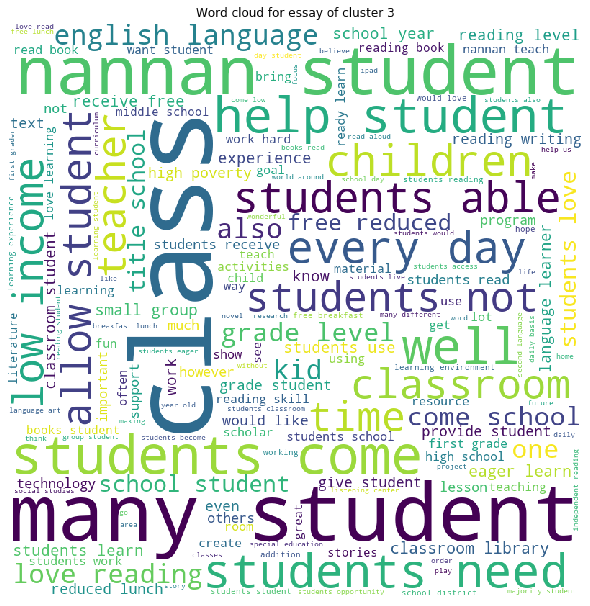

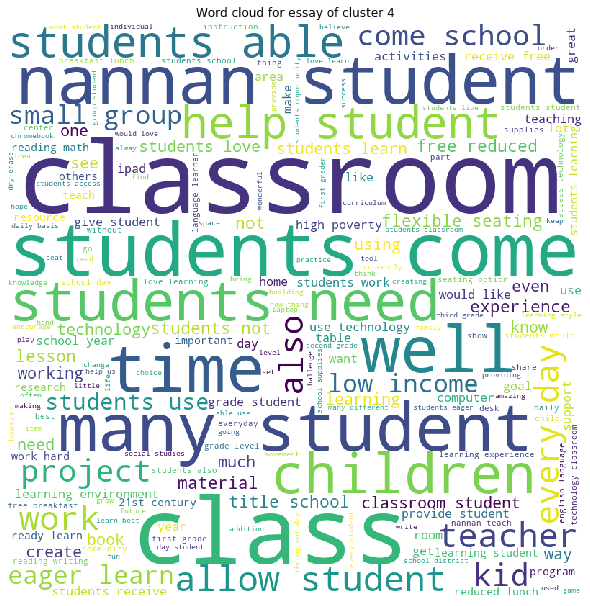

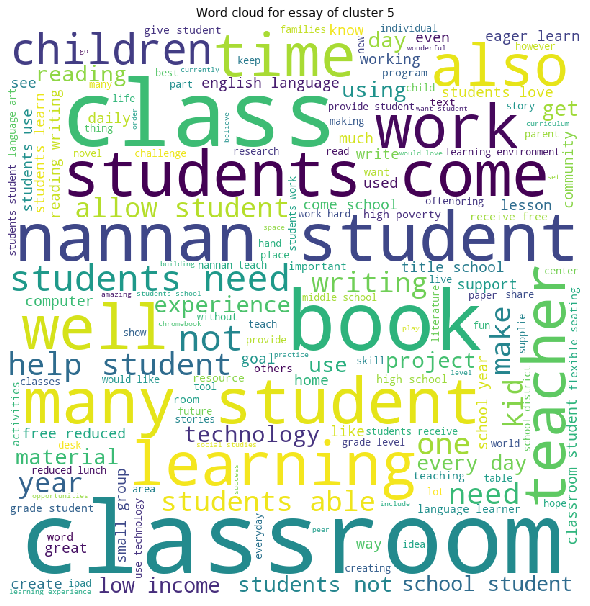

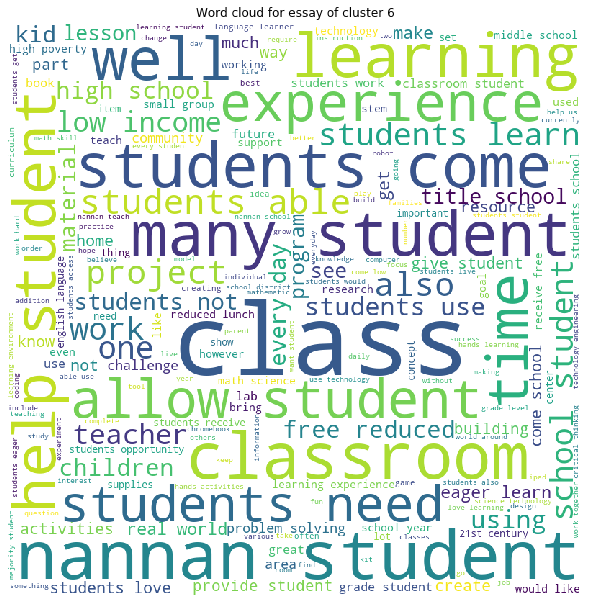

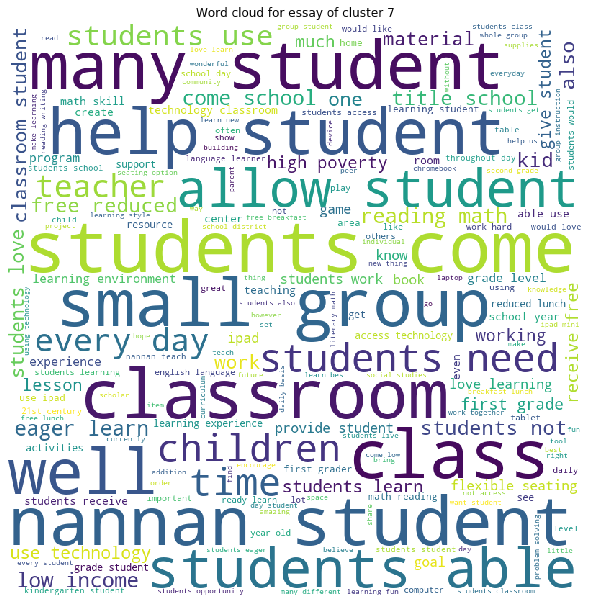

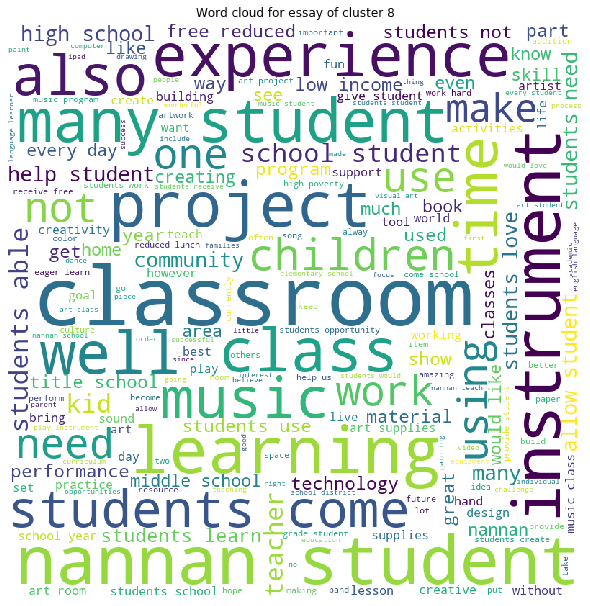

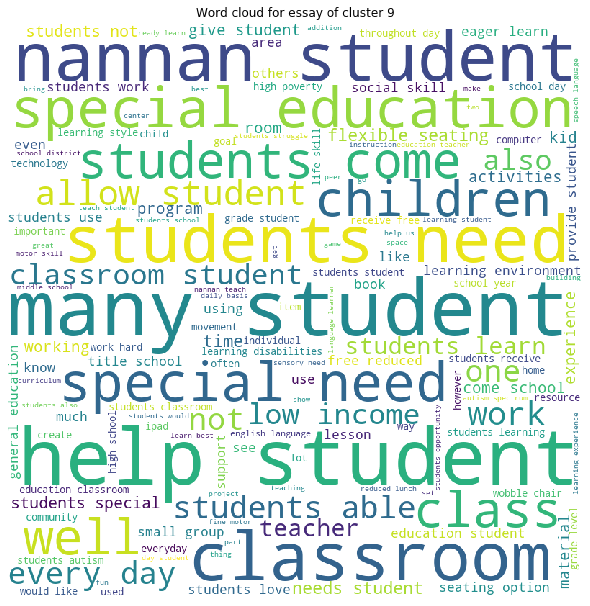

In [51]:
from wordcloud import WordCloud

for pair in clusters_essay_dictionary.items():
    cluster_no = pair[0];
    essay_list = pair[1];
    
    essay_str = "";
    for essay in essay_list:
        essay_str = essay_str + essay + ' ';
    
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(essay_str)

    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title('Word cloud for essay of cluster ' + str(cluster_no) );
    plt.show() 
    

<h2>2.6 Apply AgglomerativeClustering</h2>

In [66]:
X_agglomerative = new_train_set[:10000];
X_agglomerative.shape

(10000, 5000)

Plotting Word Cloud for Agglomerative Cluster with 2 clusters


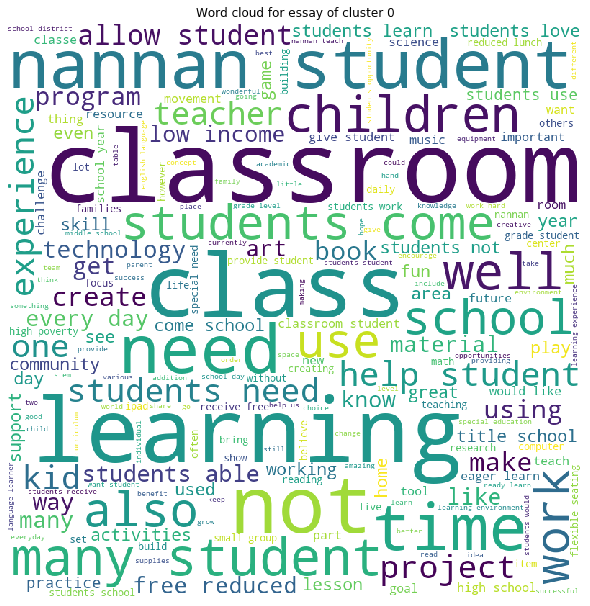

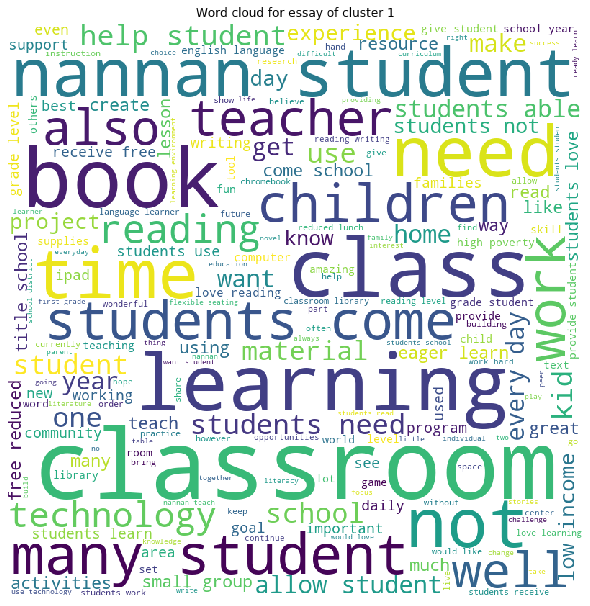

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Plotting Word Cloud for Agglomerative Cluster with 5 clusters


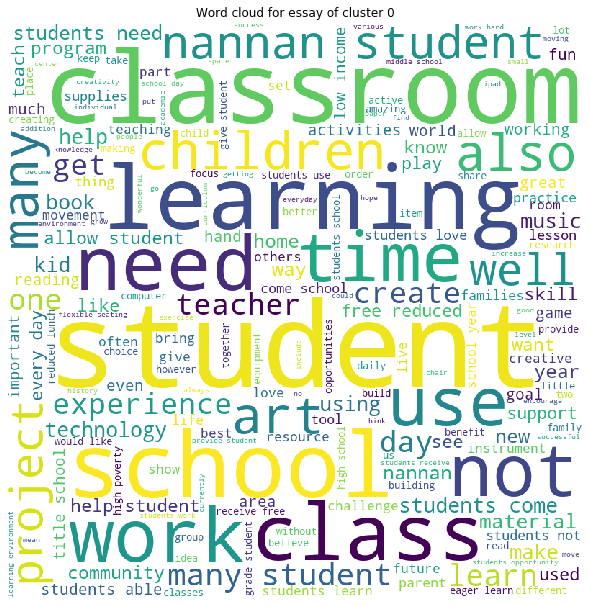

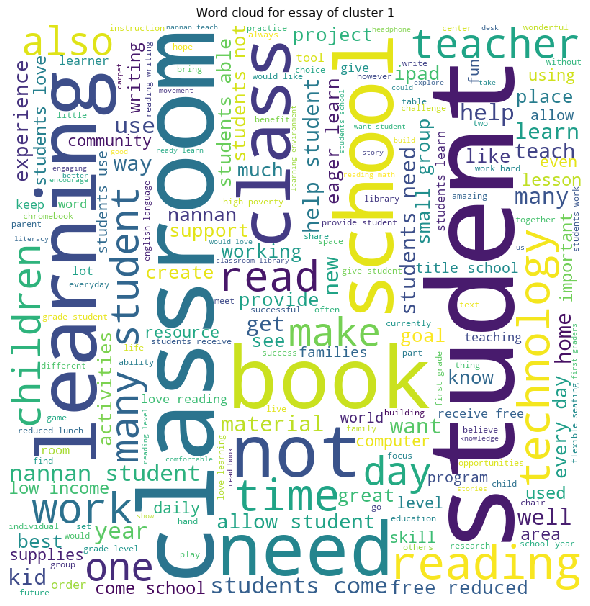

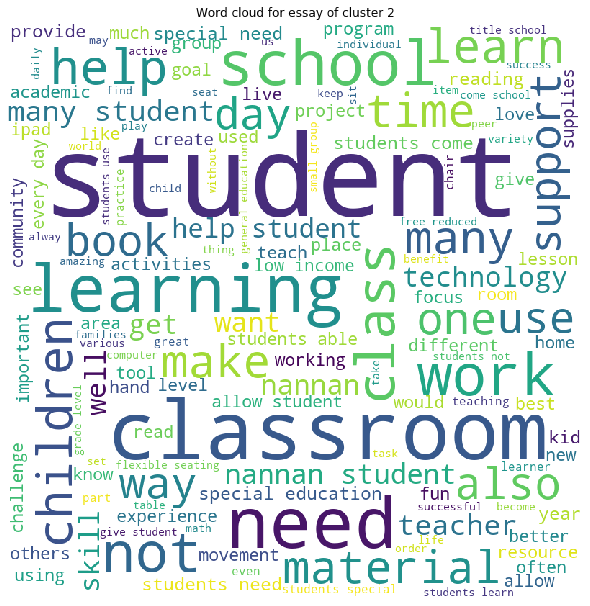

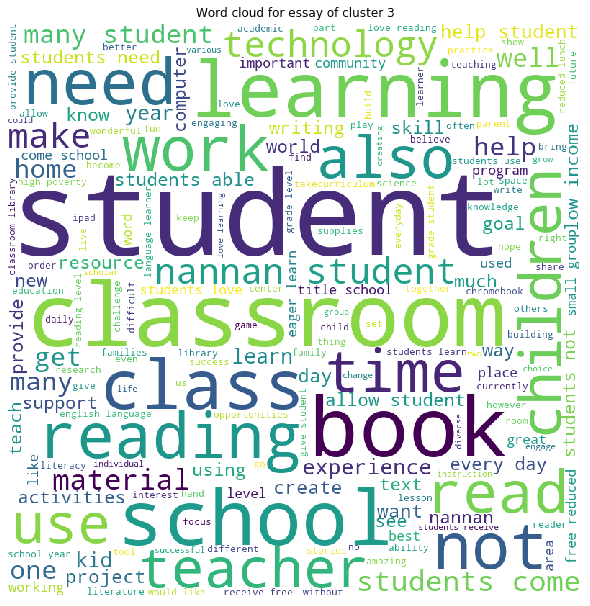

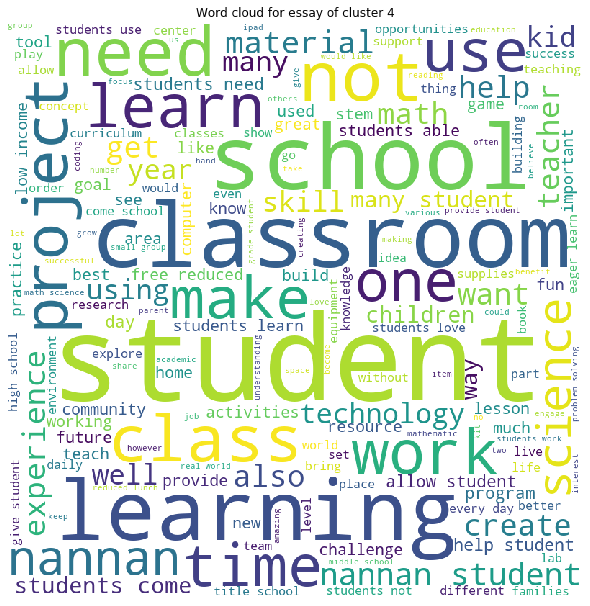

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Plotting Word Cloud for Agglomerative Cluster with 8 clusters


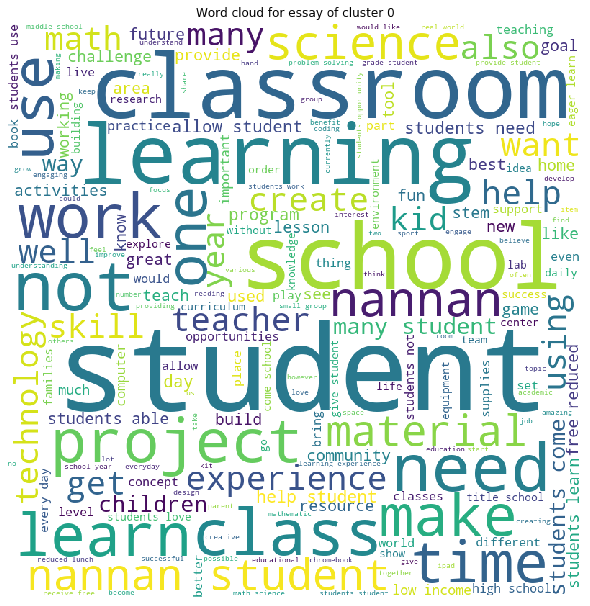

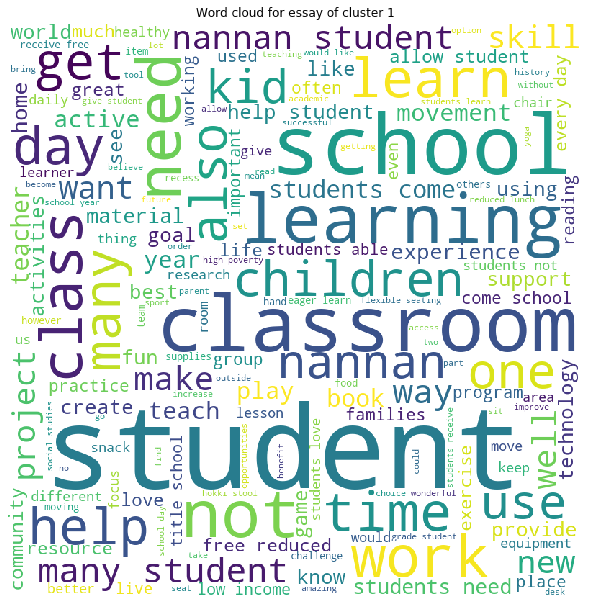

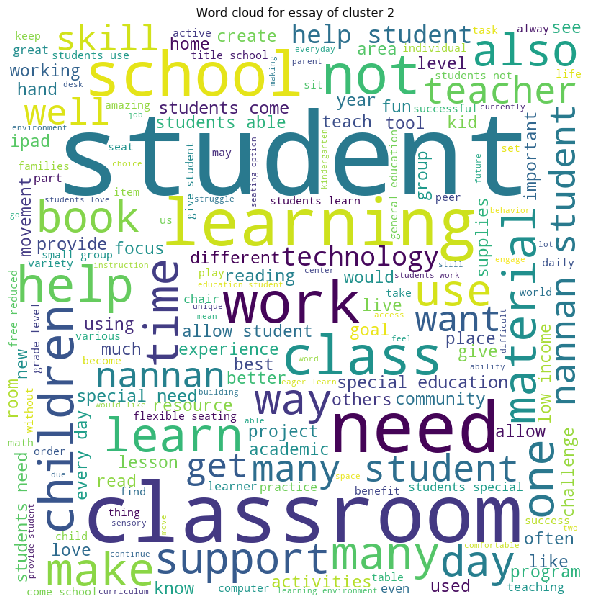

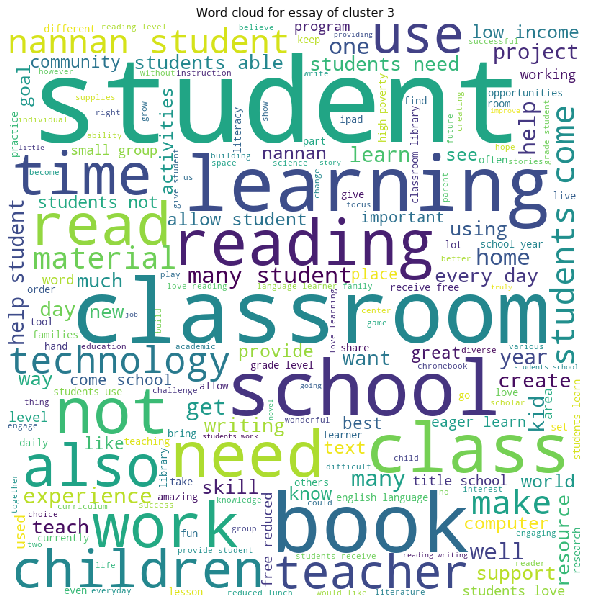

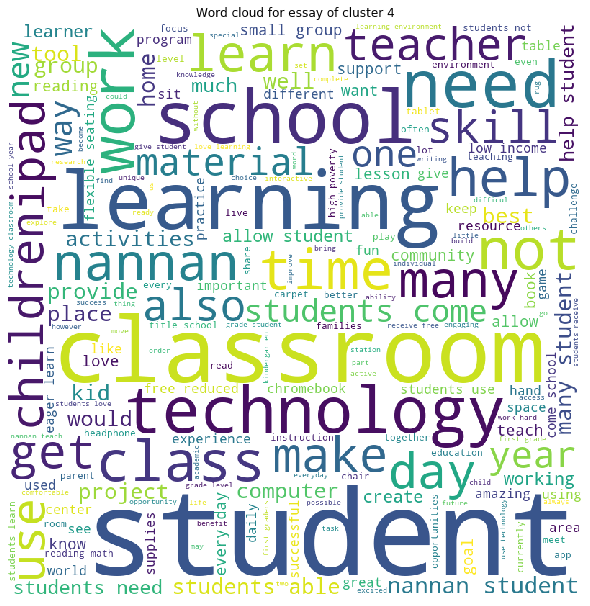

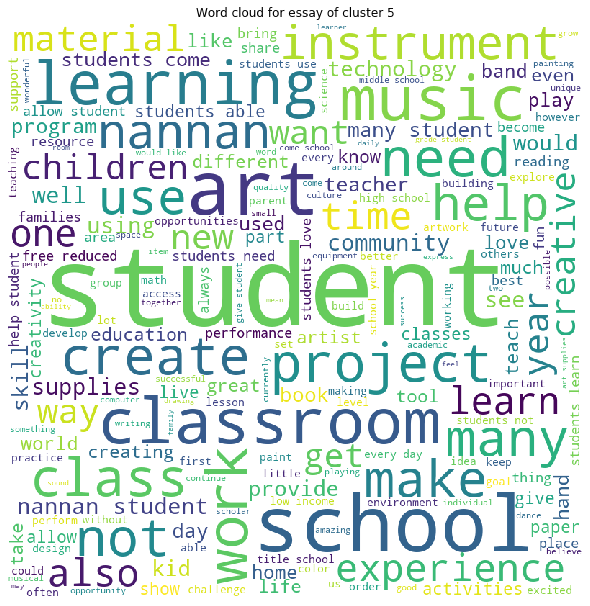

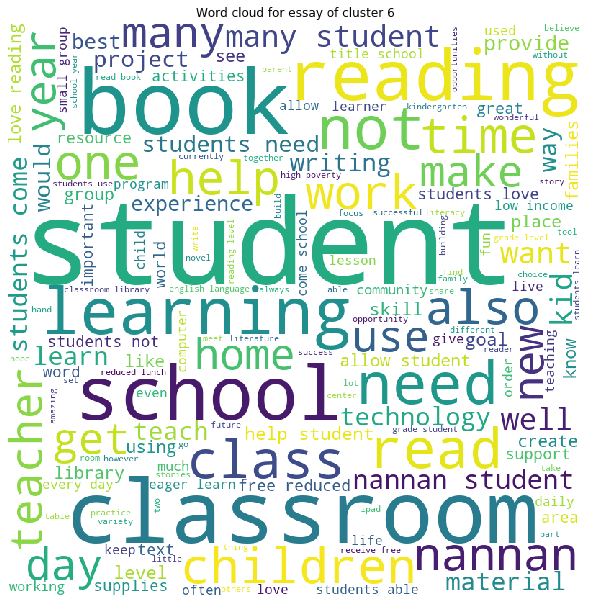

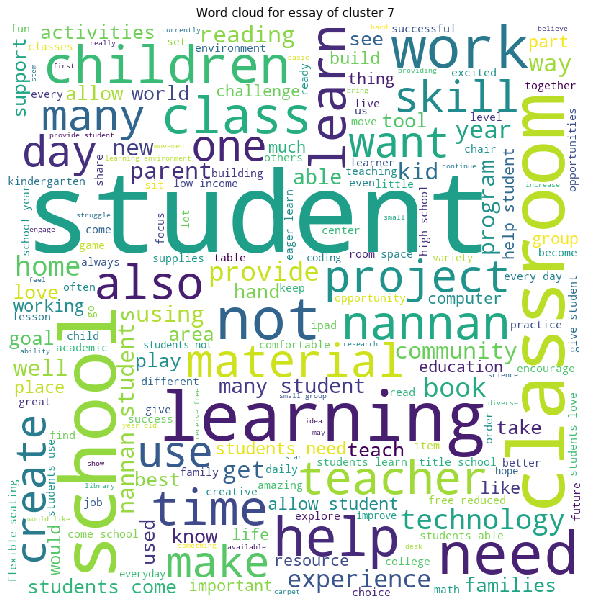

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Plotting Word Cloud for Agglomerative Cluster with 10 clusters


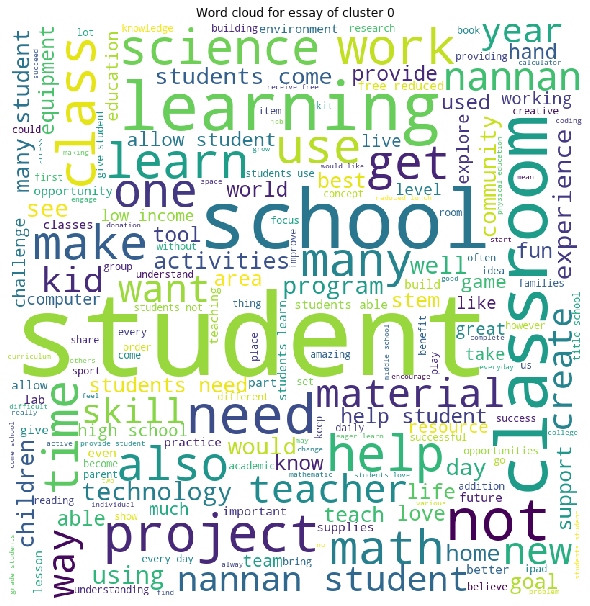

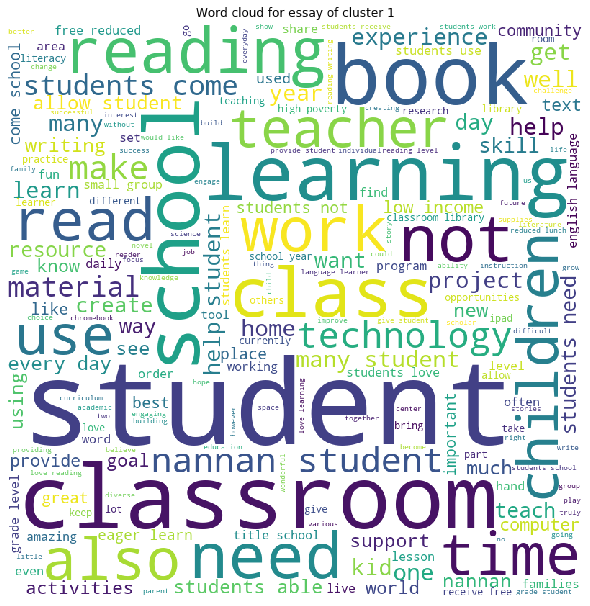

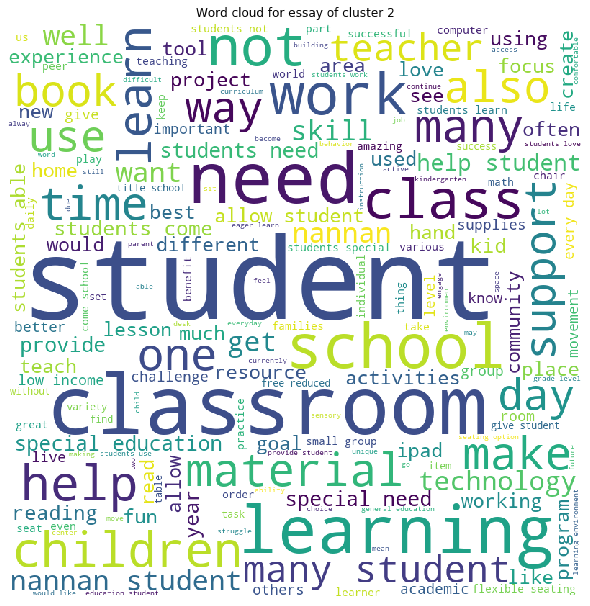

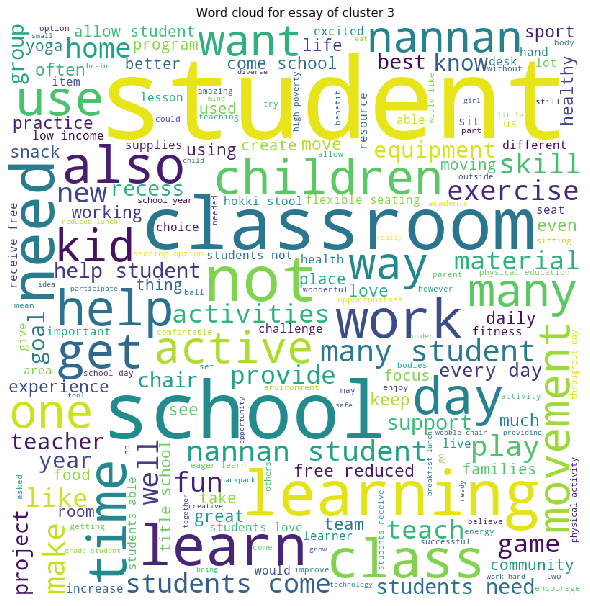

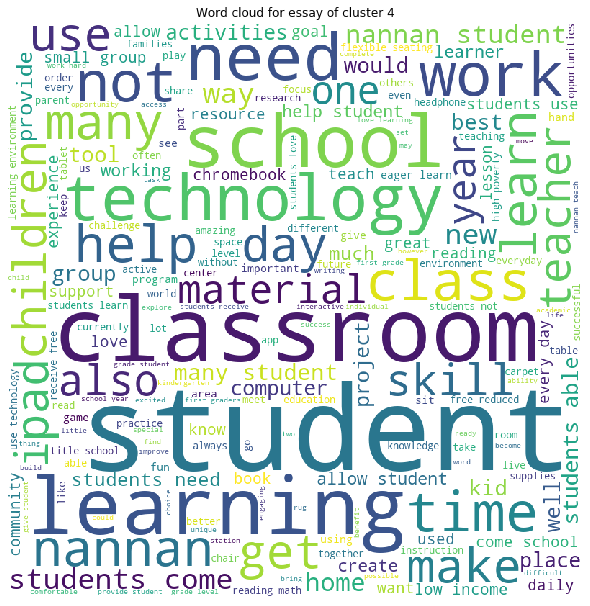

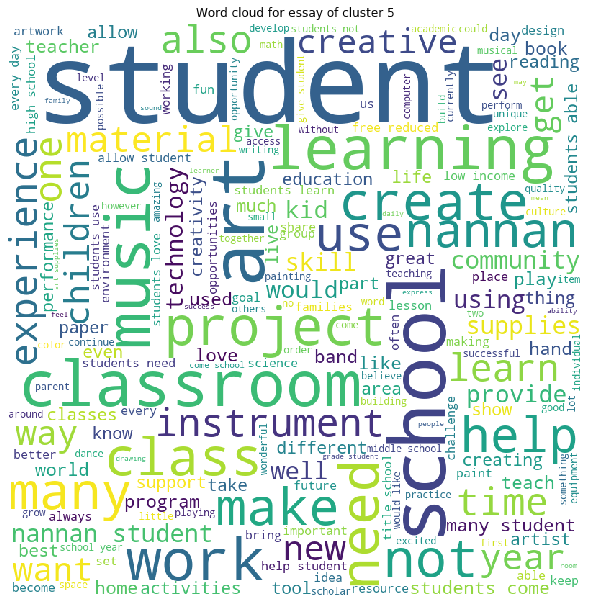

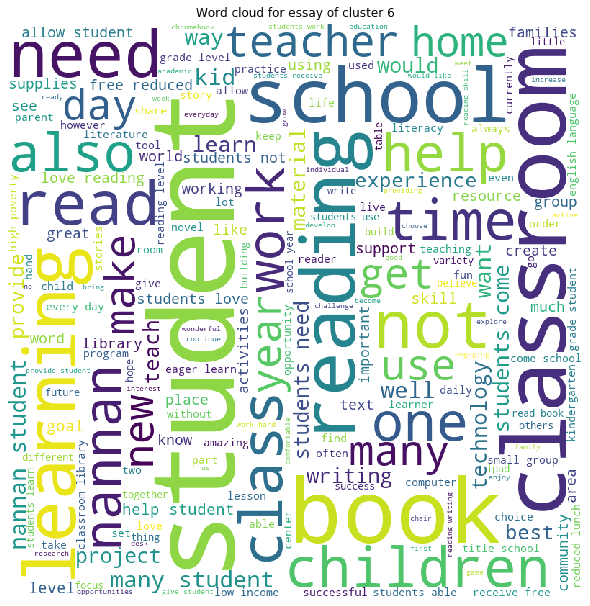

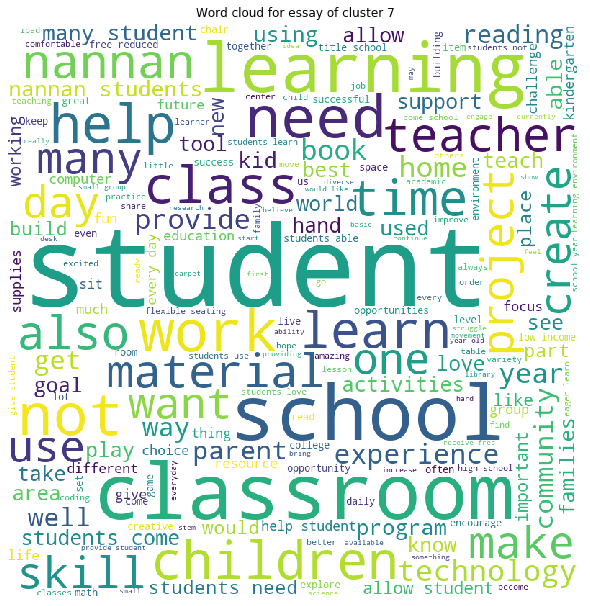

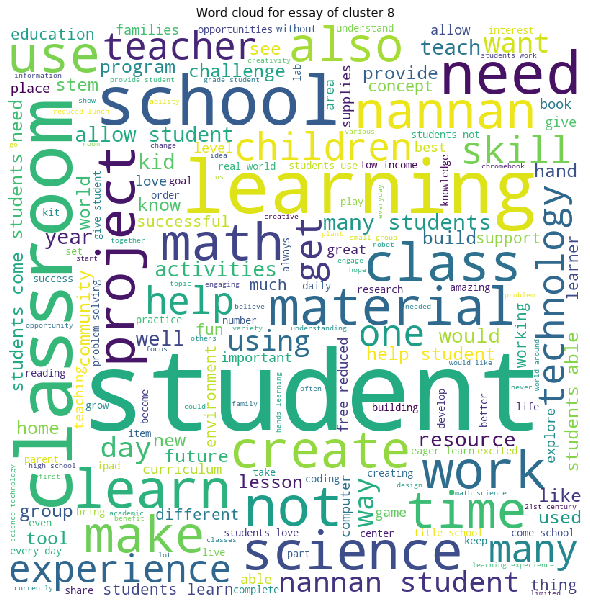

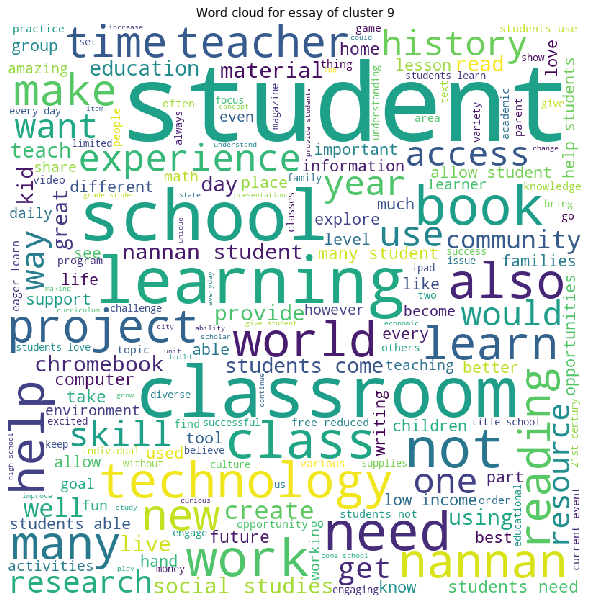

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [67]:
from sklearn.cluster import AgglomerativeClustering
clusters = [2, 5, 8, 10];

labels_dict = dict()
for cluster in clusters:
    #configuring AgglomerativeClustering
    agg_clustering = AgglomerativeClustering(n_clusters=cluster);
    agg_clustering.fit(X_agglomerative.toarray());
    
    #storing labels in dictionary along with no. of clusters used as key
    labels_dict[cluster] = agg_clustering.labels_;
    
    print('Plotting Word Cloud for Agglomerative Cluster with {} clusters'.format(cluster));
    #creating clusters_essay_dictionary to plot wordCloud
    clusters_essay_dictionary = {i: X.loc[agg_clustering.labels_ == i, 'processed_essay'] for i in range(cluster)}
    plot_wordCloud(clusters_essay_dictionary);
    
    print('-'*200);

<h2>2.7 Apply DBSCAN</h2>

In [54]:
X_dbscan = train_set_w2v[:10000];
print(X_dbscan.shape)

X = X[:10000]
print(X.shape)

(10000, 703)
(10000, 19)


### finding optimal eps value using NearestNeighbors

In [55]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=5)
neigh.fit(X_dbscan) 

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [56]:
#getting distances for all 10000 points(100 distance for each)
neigh_distance = neigh.kneighbors(X_dbscan, return_distance=True)
neigh_distance = neigh_distance[0] #kneighbors return tuple, first contains distance, second contains indices

In [57]:
#getting max distances from all points
max_distances = [point[4] for point in neigh_distance]

In [58]:
#sorting distances in asecending order
max_distances = sorted(max_distances)

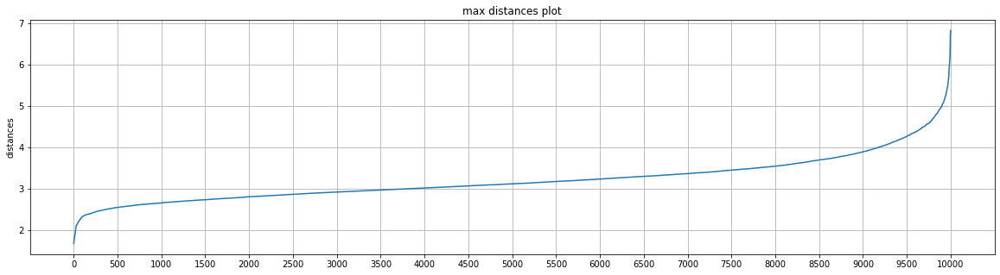

In [59]:
plt.figure(figsize=(20,5))
plt.plot(max_distances)
plt.ylabel('distances')
plt.grid()
plt.title('max distances plot')
plt.xticks(np.arange(0, 10001, 500))
plt.show()

### DBSCAN using min_samples = 2*dim

In [60]:
from sklearn.cluster import DBSCAN

#from 4500 index onwards we can see that there is significat improve in distance so we choose eps value present at index 9500
eps = max_distances[9000]

#min_samples = 2*dim, since dim=703
dbscan = DBSCAN(eps=eps, min_samples=1406)
dbscan.fit(X_dbscan)

DBSCAN(algorithm='auto', eps=3.897657898799017, leaf_size=30,
       metric='euclidean', metric_params=None, min_samples=1406, n_jobs=None,
       p=None)

In [61]:
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

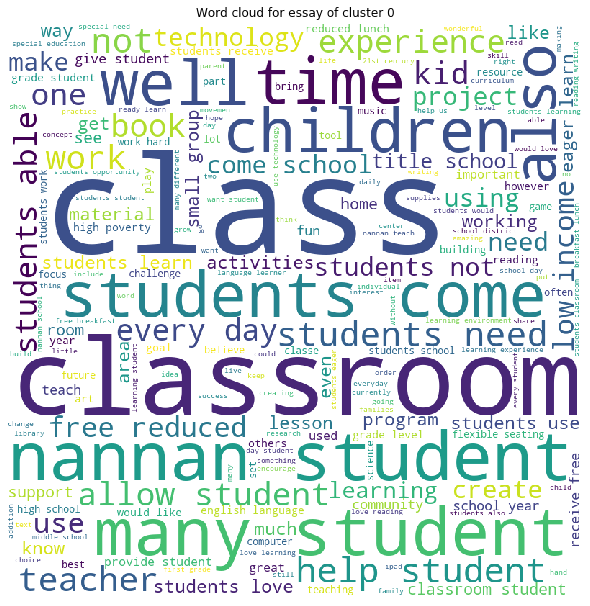

In [62]:
clusters_essay_dictionary = {i: X.loc[labels == i, 'processed_essay'] for i in range(n_clusters_)}
plot_wordCloud(clusters_essay_dictionary);

### DBSCAN using min_samples = dim

In [63]:
#from 4500 index onwards we can see that there is significat improve in distance so we choose eps value present at index 9500
eps = max_distances[9000]

#min_samples = 2*dim, since dim=703
dbscan = DBSCAN(eps=eps, min_samples=703)
dbscan.fit(X_dbscan)

DBSCAN(algorithm='auto', eps=3.897657898799017, leaf_size=30,
       metric='euclidean', metric_params=None, min_samples=703, n_jobs=None,
       p=None)

In [64]:
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

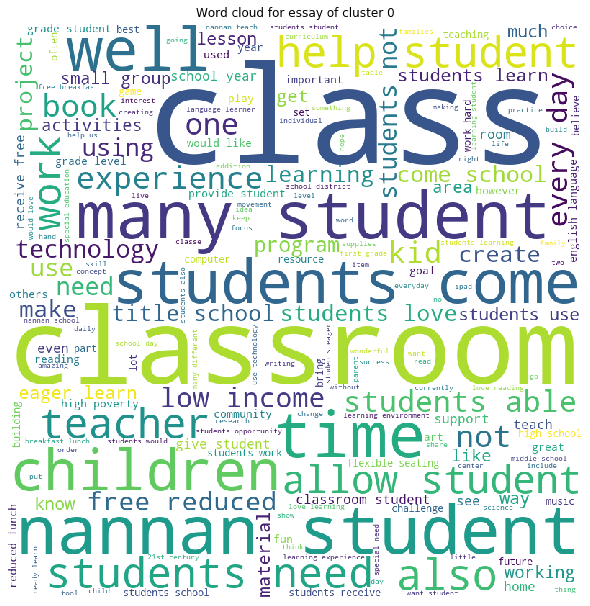

In [65]:
clusters_essay_dictionary = {i: X.loc[labels == i, 'processed_essay'] for i in range(n_clusters_)}
plot_wordCloud(clusters_essay_dictionary);

<h1>3. Conclusion</h1>

- By Observing above wordclouds, we can't seperate clusters on basis of project acceptance.
- Though clusters are telling about for which work the project proposal is raised, but clusters can't classify them whether that project will be accepted or not

In [73]:
from prettytable import PrettyTable

table = PrettyTable()
table.field_name = ['Algorithm', 'Hyper Parameter', '# clusters']
table.add_row(['K-means', 'n_clusters', '10'])
table.add_row(['Agglomerative', 'n_clusters','2, 5, 8, 10'])
table.add_row(['DBSCAN', 'eps('+str(eps)+'), min_samples(703)', '1'])
print(table)

+---------------+------------------------------------------+-------------+
|    Field 1    |                 Field 2                  |   Field 3   |
+---------------+------------------------------------------+-------------+
|    K-means    |                n_clusters                |      10     |
| Agglomerative |                n_clusters                | 2, 5, 8, 10 |
|     DBSCAN    | eps(3.897657898799017), min_samples(703) |      1      |
+---------------+------------------------------------------+-------------+
